In [1]:
import warnings
import pandas as pd
from sklearn.decomposition import PCA, NMF
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import make_pipeline
import shap

In [2]:
from scripts.get_statements import get_statements
from scripts.get_prices import get_prices
from scripts.metrics import get_scores, display_graphs
with warnings.catch_warnings():
    warnings.filterwarnings("ignore")
    from scripts.st_cache import SENTENCE_TRANSFORMER_CACHE
from scripts.sklearn import ClassifiedRegressor, EncoderTransformer, SentenceSelector
from scripts.shap import masker, ShapModel

In [3]:
import os
try:
    os.mkdir('./data')
except FileExistsError:
    pass

In [ ]:
docs = get_statements('2008-01-01', '2024-07-01')
docs.to_parquet('./data/FOMC_statements.parquet')

In [4]:
docs = pd.read_parquet('./data/FOMC_statements.parquet')

In [5]:
symbols = './tickers.csv'

In [6]:
prices = get_prices(symbols, 45, 20, docs.index.min(), docs.index.max())
prices.to_parquet('./data/prices.parquet')

In [7]:
prices = pd.read_parquet('./data/prices.parquet')

In [8]:
seed=0
model_name = 'philschmid/bge-base-financial-matryoshka'
# model_name = 'FinLang/finance-embeddings-investopedia'

In [9]:
def splitter(ser):
    return ser.str.replace(
        r'\r\n', ' ', regex=True
    ).str.split(
        r'\n', regex=True
    ).explode(
    ).str.strip(
    ).str.replace(
        r'\s+', ' ', regex=True
    )

def condition(ser):
    conds =[
        ser!='',
        ~ser.str.contains(r'^Voting for'),
        ~ser.str.contains('[email protected]', regex=False),
        ~ser.str.lower().str.contains(r'implementation note issued.*\d'),
        ser.str.split(' ').apply(len)>15,
    ]
    return pd.concat(conds, axis=1).all(axis=1)

def examples(ser):
    return (
        (ser.str.lower().str.contains('the committee decided')\
        & ser.str.contains(r'\d\spercent', regex=True))
        | ser.str.contains('Federal Reserve Actions')\
    )

In [177]:
selector = SentenceSelector(
    splitter, 
    SENTENCE_TRANSFORMER_CACHE(model_name), 
    condition,
    examples, 
    KNeighborsRegressor(5)
)

tfidf_model = make_pipeline(
    selector,
    TfidfVectorizer(min_df=.05, max_df=.5),
    NMF(6, max_iter=1000),
    ClassifiedRegressor(LinearRegression(), False)
)

enc_model = make_pipeline(
    selector,
    EncoderTransformer(model_name),
    PCA(24),
    ClassifiedRegressor(LinearRegression(), False)
)

In [178]:
y = prices.asfreq('D').bfill().loc[docs.index]
y = y.dropna(axis=1)#.sort_index(axis=1)

In [179]:
X_, X_test, y_, y_test = train_test_split(docs, y, test_size=.4, random_state=seed)

In [180]:
tfidf_model.fit(X_, y_)
enc_model.fit(X_, y_);

In [181]:
get_scores(y_test, tfidf_model.decision_function(X_test),0)

,acc,mse,pearson
Ticker,,,
13 Week Treasury Bill,0.477561,4.607039,-0.138357
NASDAQ Composite,0.528428,0.946904,0.267823
Russell 2000,0.533159,0.951595,0.227018
S&P 500,0.589477,0.902036,0.349750
Treasury Yield 30 Years,0.517725,1.066939,0.126704
Volatility Index,0.484406,0.960154,0.212622


In [182]:
get_scores(y_test, enc_model.decision_function(X_test),0)

,acc,mse,pearson
Ticker,,,
13 Week Treasury Bill,0.490205,24.044279,-0.133499
NASDAQ Composite,0.599739,0.902112,0.357935
Russell 2000,0.560060,0.871769,0.367328
S&P 500,0.613854,0.806923,0.473613
Treasury Yield 30 Years,0.537718,1.006090,0.287658
Volatility Index,0.440496,0.851700,0.449209


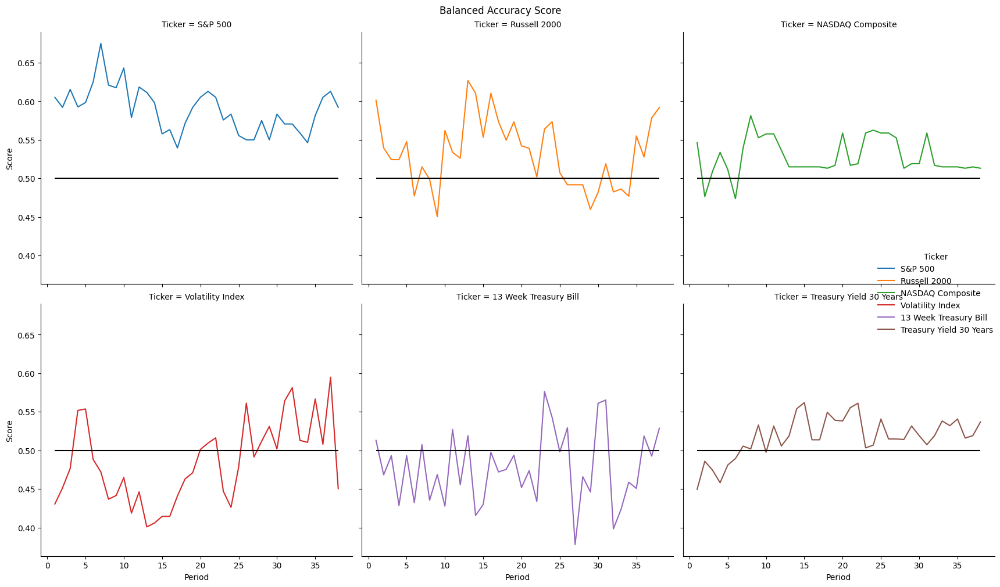

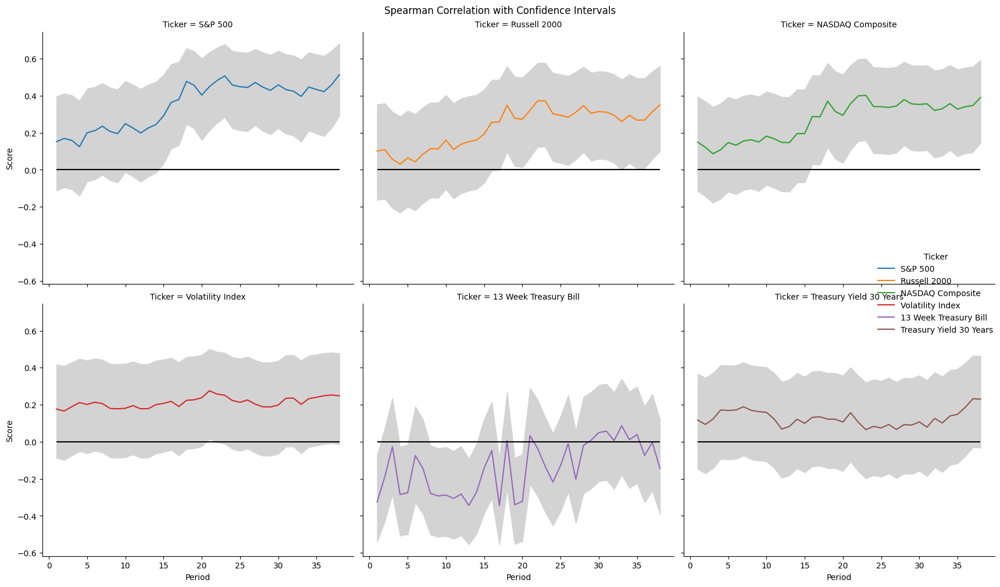

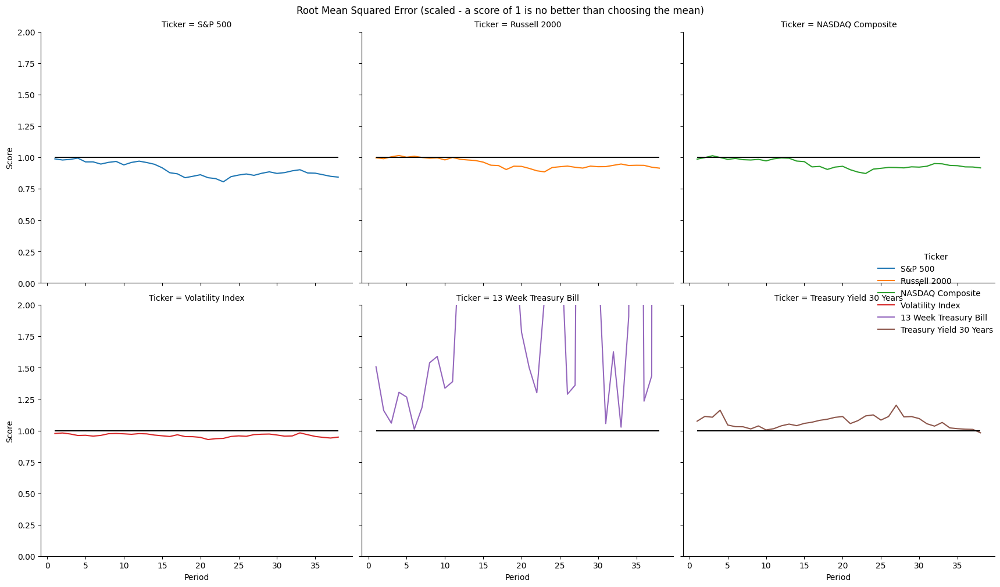

In [184]:
display_graphs(y_test, tfidf_model.decision_function(X_test), 0)

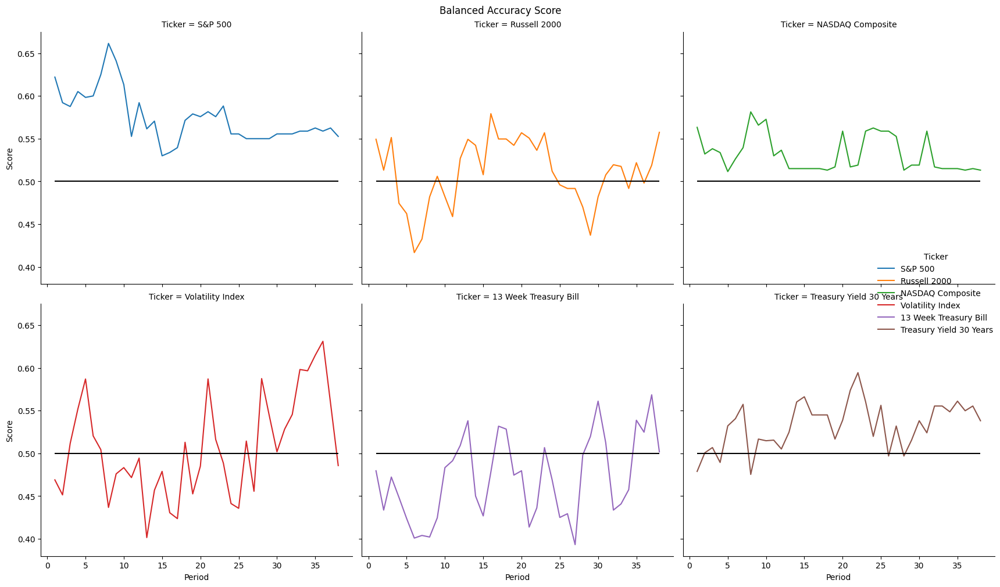

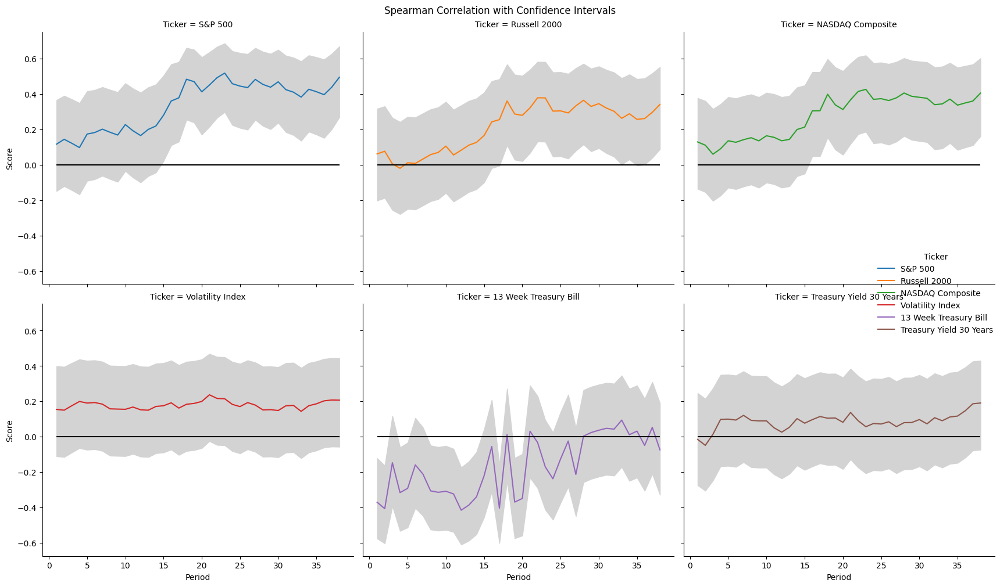

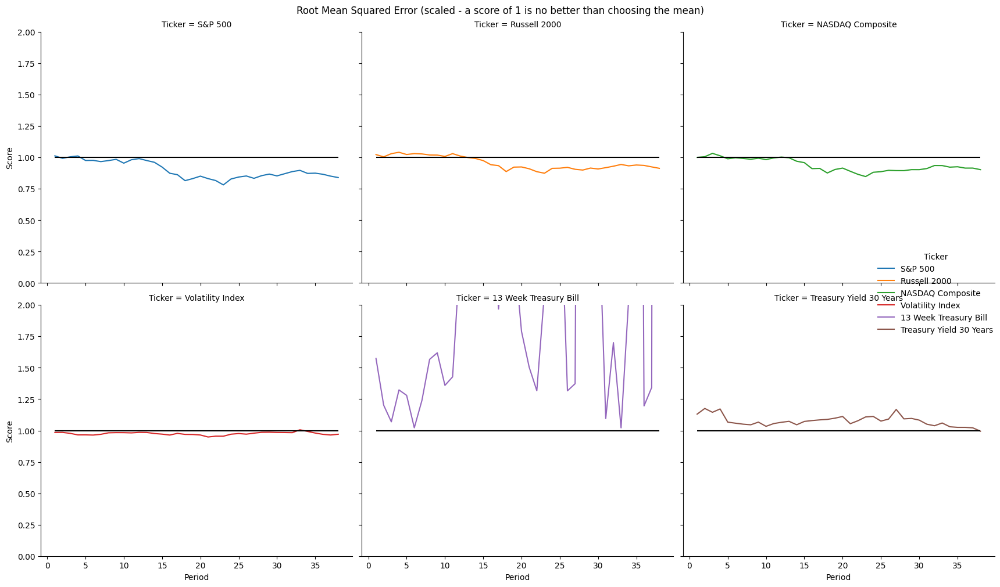

In [ ]:
display_graphs(y_test, tfidf_model.decision_function(X_test), 0)

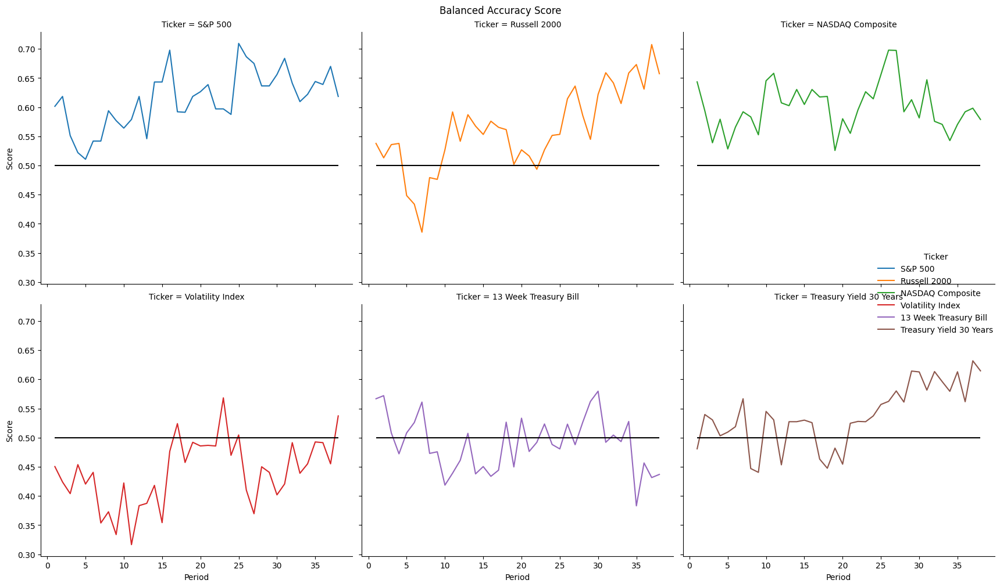

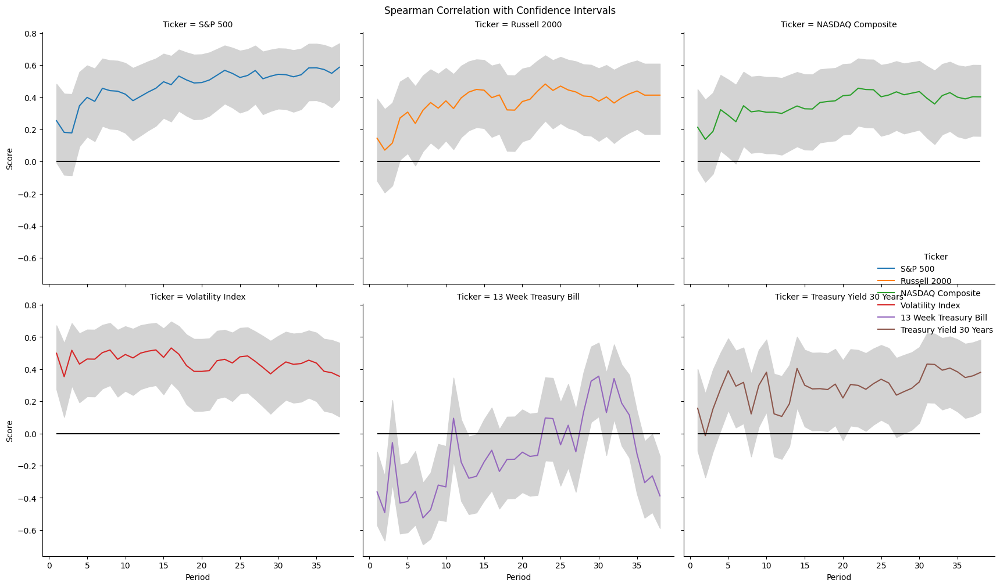

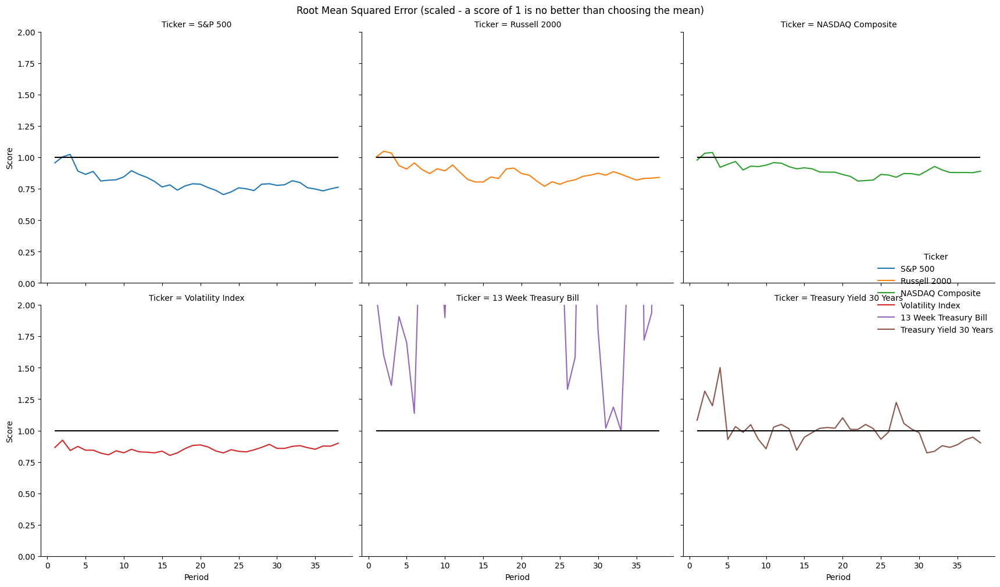

In [70]:
display_graphs(y_test, enc_model.decision_function(X_test), 0)

In [185]:
from wordcloud import WordCloud

In [186]:
tfidf = tfidf_model[1]
nmf = tfidf_model[2]

In [187]:
vocab = tfidf.vocabulary_
vocab = sorted(vocab, key=lambda w: vocab[w])
features = nmf.components_
frequencies = pd.DataFrame(features.T, vocab)

In [188]:
snp_cols = y.columns.get_level_values(1)=='S&P 500'

In [208]:
lin_reg = tfidf_model[3].estimator
coefs = lin_reg.coef_[snp_cols].mean(0)

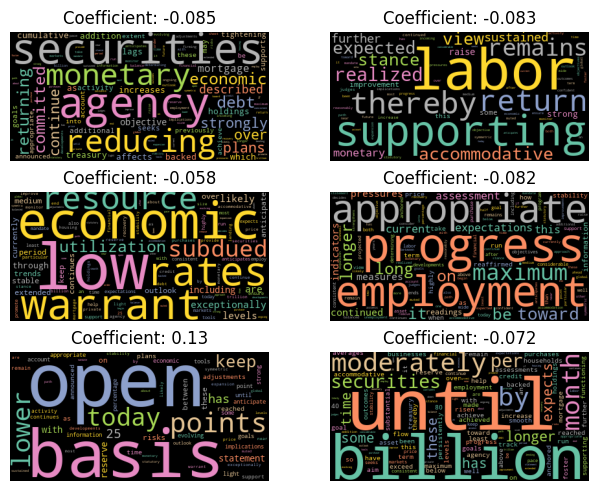

In [222]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(3, 2, layout='constrained')
for i, ax in enumerate(axes.ravel()):
    wc = WordCloud(colormap='Set2')
    wc.generate_from_frequencies(frequencies[i])
    ax.imshow(wc)
    ax.set_title(f'Coefficient: {coefs[i]:.2}')
    ax.set_axis_off()

In [223]:
test_examples = [
    '2012-12-12',
    '2021-06-16',
    '2009-08-12',
    '2019-03-20',
    '2010-05-09',
]
test_examples = pd.to_datetime(test_examples)
test_examples = X_test[X_test.index.isin(test_examples)]

In [224]:
shap_model = ShapModel(enc_model, 30, y_)

ticker_names = y[y.columns.get_level_values(0)[0]].columns

explainer = shap.Explainer(shap_model, masker, output_names=ticker_names)

shap_values = explainer(enc_model[0].transform(test_examples))

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 3/5 [05:24<03:50, 115.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 4/5 [06:11<01:26, 86.73s/it] 

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 5/5 [07:48<00:00, 90.56s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 6it [09:17, 111.52s/it]                      


In [225]:
shap.plots.text(shap_values)